<p style = "font-family: Arial; font-size:2.75em; color: purple; font-style: bold"><br><br> Satellite Image Data Analysis <br><br> using Numpy. <br><br>

<p style = "font-family: Arial; font-size:1.25em; color: black; font-style: bold"><br><br> Usage of Numpy, Scipy and Matplotlib libraries. <br><br> Worksheet by: Aleph Jimenez <br><br> Date: 2021.10.05 <br><br>

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style: bold"><br><br> Data Source: Satellite Image from<br><br> WIFIRE Project:<br><br>

WIFIRE is an integrated system for wildfire analysis, with specific regard to charging urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can  read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satllite image dataset form WIFIRE using the numpy library

<p style = "font-family:Arial; font-size: 1.75em; color: #2462C0; font-style: bold"><br><br> Loading the libraries we need:<br><br> numpy, scipy and matplotlib.<br><br>

In [2]:
%matplotlib inline
import imageio
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style: bold"><br><br> Creating a numpy array from an image file: <br><br>

Lets choose a WIFIRE satellite image file as an ndarray and display its type.

In [3]:
from skimage import data

photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')

type(photo_data)

imageio.core.util.Array

Let's see what is in the image

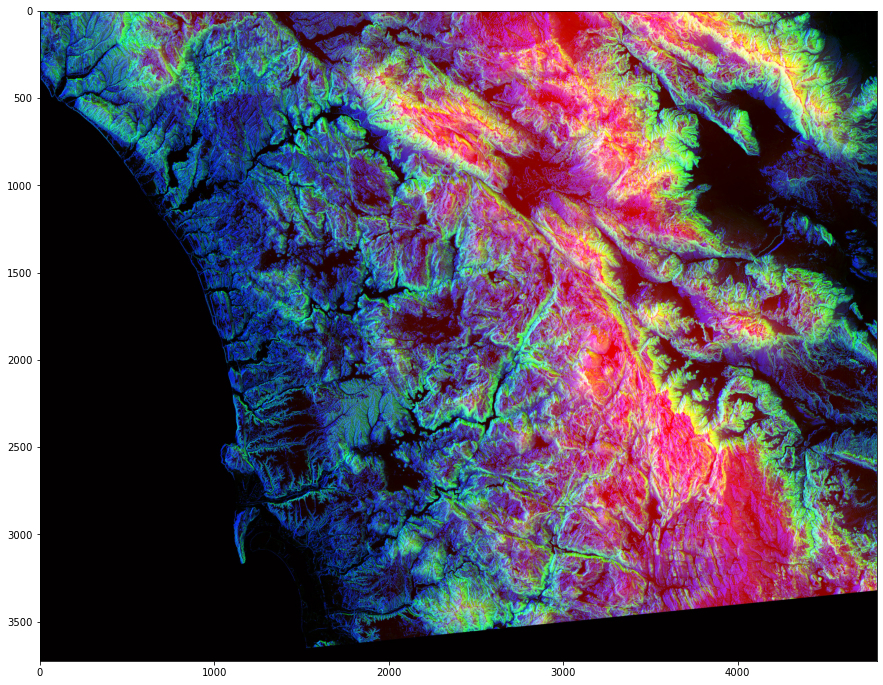

In [15]:
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

In [17]:
photo_data.shape

print(photo_data)

[[[  0  22  35]
  [  0  11  57]
  [ 19  32 128]
  ...
  [ 19  21  98]
  [  0   6  28]
  [  0  19   0]]

 [[ 30  64 109]
  [ 29  46 128]
  [ 25  33 157]
  ...
  [  1   5  50]
  [  0   5  34]
  [  0   4  28]]

 [[ 23  57 155]
  [ 16  35 174]
  [ 15  24 189]
  ...
  [  0   5   9]
  [  0   5  34]
  [  0   2  69]]

 ...

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]]


The shape of the ndarray show that is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue. <br>

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style: bold"> RGB Color Mapping in the Photo: </p><br> 
<ul>
<li><p style = "font-family: Arial; font-size: 1.75em; color:red; font-style: bold"> 
RED pixel indicates Altitude </p><br>
<li><p style = "font-family: Arial; font-size: 1.75em; color:blue; font-style: bold">
Blue pixel indicates Aspect </p><br>
<li><p style = "font-family: Arial; font-size: 1.75em; color: green; font-style: bold">
Green pixel indicates Slope 
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.

In [18]:
# We're gonna explore what's the size of the image:

photo_data.size

53606475

In [20]:
# We're gonna explore the maximum and minimum.

photo_data.max(), photo_data.min()

(255, 0)

In [21]:
photo_data.mean()

75.8299354508947

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"> Pixel on the 150th Row and 250th Column <br><br>

In [22]:
photo_data[150, 250]

Array([ 17,  35, 255], dtype=uint8)

In [23]:
photo_data[150, 250, 1]

35

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style:bold"><br> Set a Pixel to All Zeros </p>
</ul>
<br>
 We can set all three layer in a pixel as once by assigning zero globally to that (row, column) pairing.<br> However, setting one pixel to zero is not noticeable.

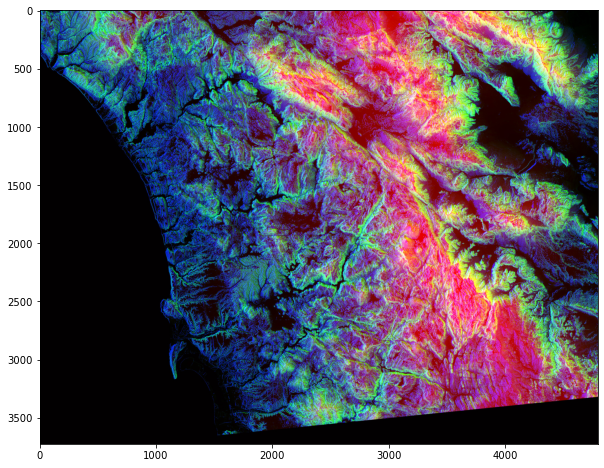

In [4]:
#photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style: bold"><br>Changing Colors in a Range
</p>
</ul>
<br>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 to 800 to full intensity.

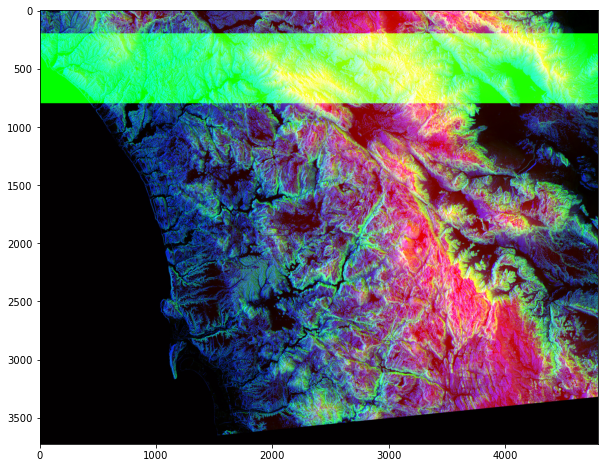

In [6]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')

photo_data[200:800, : , 1] = 255
plt.figure(figsize = (10,10))
plt.imshow(photo_data)

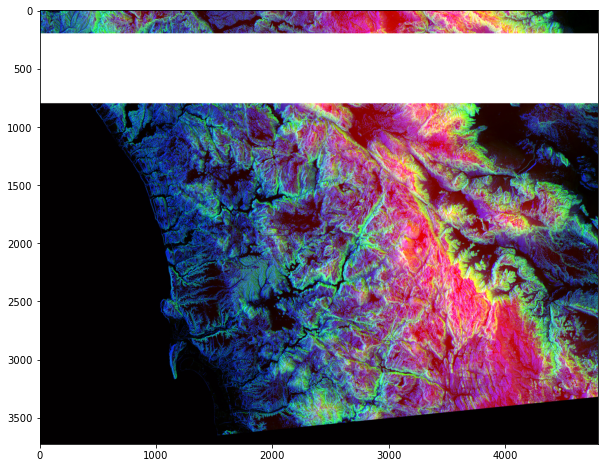

In [7]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')

photo_data[200:800, :] = 255
plt.figure(figsize = (10,10))
plt.imshow(photo_data)

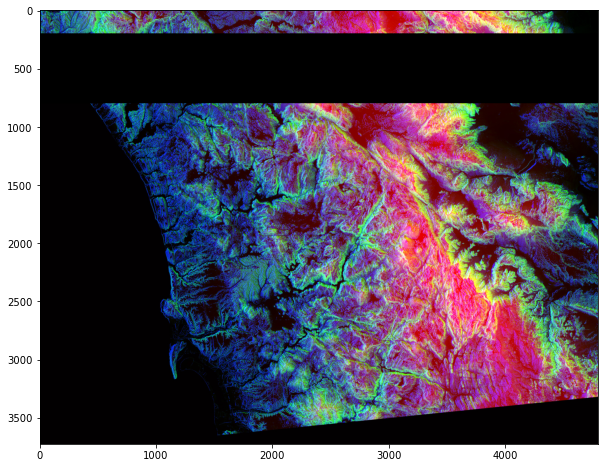

In [8]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')

photo_data[200:800, :] = 0
plt.figure(figsize = (10,10))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"><br> Pick all Pixels with Low Values<br><br>

In [49]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"><br> Filtering Out Low Values<br>
</p>
</ul>
<br>Whenever the low-value_filter is TRUE, set value to 0.

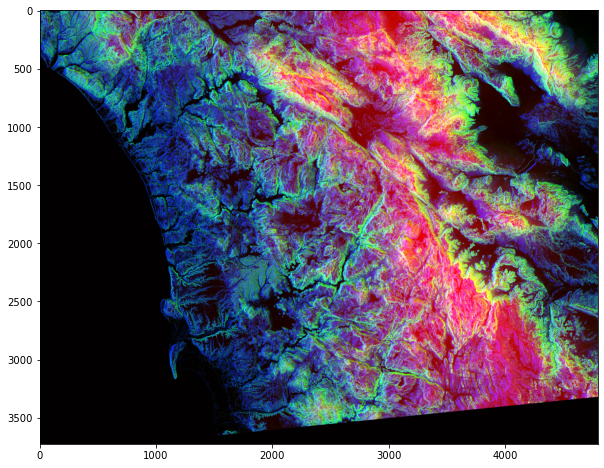

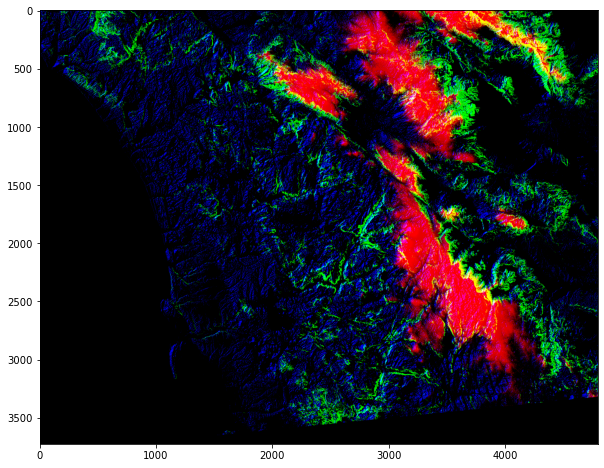

In [50]:
#import random
plt.figure(figsize = (10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize = (10,10))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"><br>More Row and Column Operations
</p>
</ul>
<br>
You can design complex patterns by making columns function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [4]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [56]:
photo_data[rows_range,cols_range] = 255

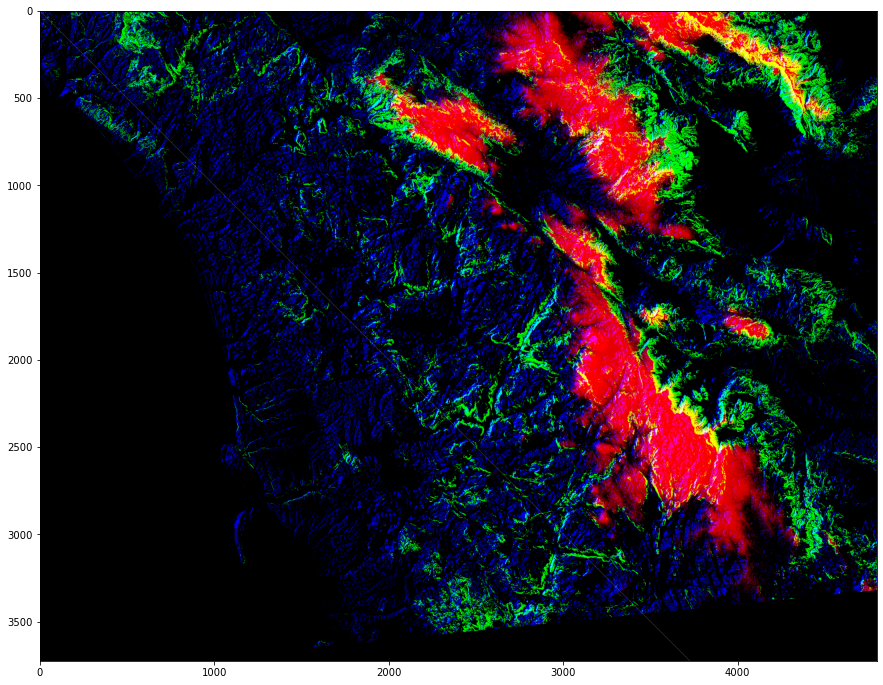

In [57]:
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"><br> Masking Images<br>
</p>
</ul>
<br>
Now let us try something even cooler... a mask that is in shape of a circular disc.<br><br>

In [5]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
#print("X = ", X.shape, "and Y = ", Y.shape)

#print(X,Y)

In [6]:
center_row, center_col = total_rows / 2, total_cols / 2
#print("center_row = ", center_row, "AND center_col = ", center_col)

#print(X - center_row)
#print(Y - center_col)

dist_from_center = (X - center_row)**2 + (Y - center_col)**2
#print(dist_from_center)

radius = (total_rows / 2)**2
#print("Radius = ", radius)

circular_mask = (dist_from_center > radius)
#print(circular_mask)
#print(circular_mask[1500:1700, 2000:2200])

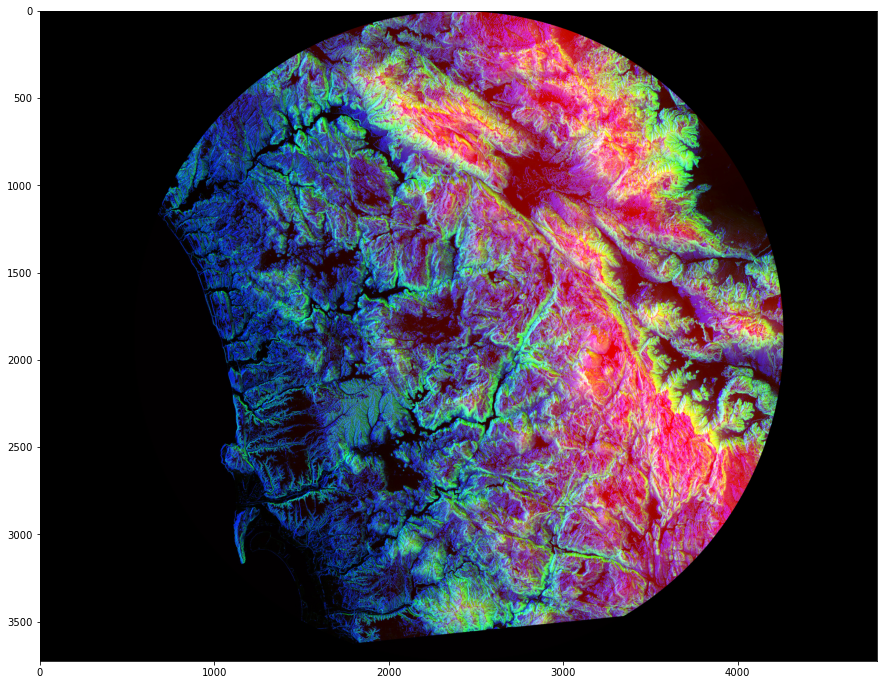

In [23]:
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

<p style = "family-font">

<p style = "font-family: Arial; font-size: 1.75em; color:#2462C0; font-style:bold"><br> Further Masking <br>
</p>
</ul>
<br>
Yo can further improve the mask, for example just get upper half disc. <br><br>

In [7]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row  #this line generates a mask for all rows above the center.

half_upper_mask = np.logical_and(half_upper, circular_mask)

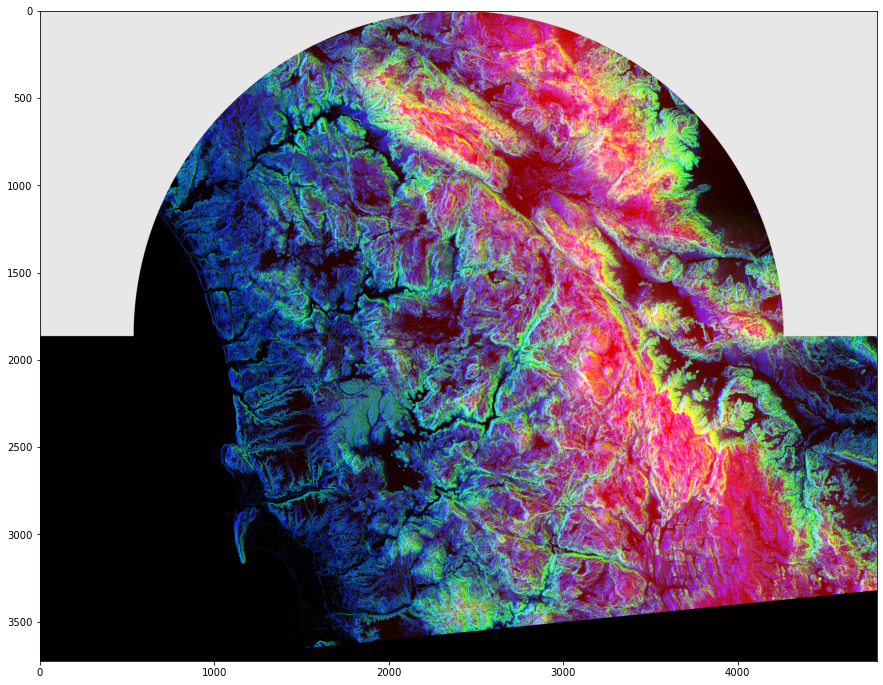

In [9]:
import random
photo_data = imageio.imread('./numpy_satellite/wifire/sd-3layers.jpg')
photo_data[half_upper_mask] = 225
#photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 2.75em; color: purple; font-type: bold"> <br><br> Further Processing of <br><br> our Satellite Imagery.<br><br>

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-type: bold">Processing of RED Pixels <br><br>
</p>
</ul>
<br>
Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

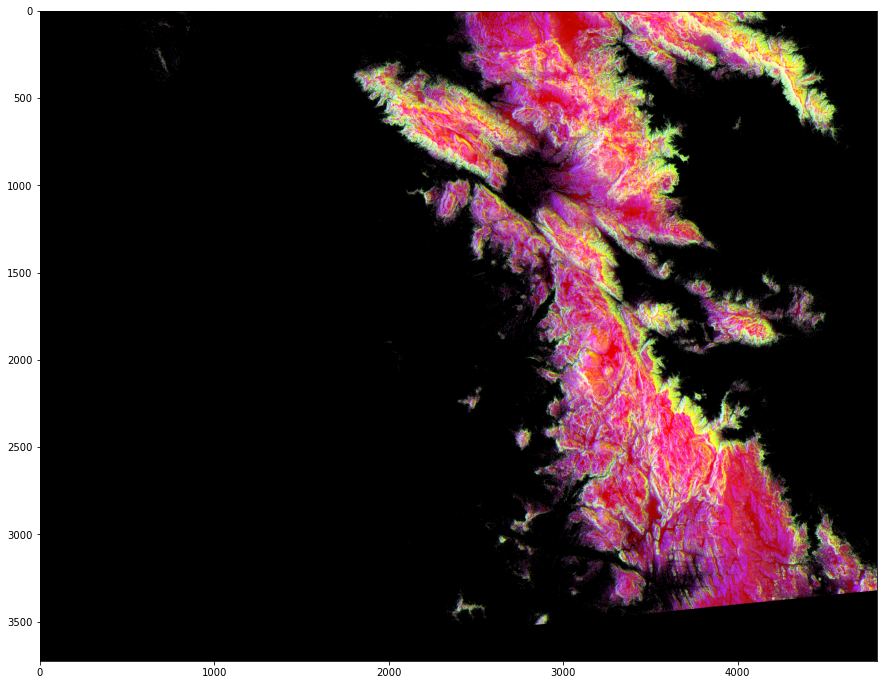

In [10]:
photo_data = imageio.imread("./numpy_satellite/wifire/sd-3layers.jpg")
red_mask = photo_data[:, :, 0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size: 1.75em; color: #2462C0; font-style: bold"> <br><br> Detecting Highly-GREEN Pixels<br><br>

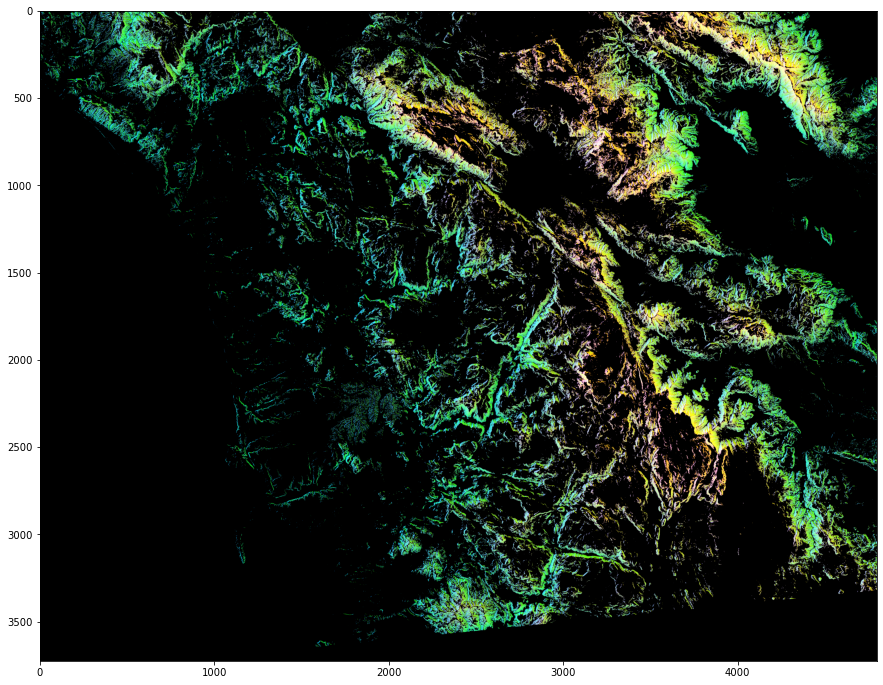

In [20]:
photo_data = imageio.imread("./numpy_satellite/wifire/sd-3layers.jpg")
green_mask = photo_data[:, :, 1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style = "font-family:Arial; font-size:1.75em; color:#2462C0; font-type:bold"> Detecting Highly-BLUE Pixels <br><br>

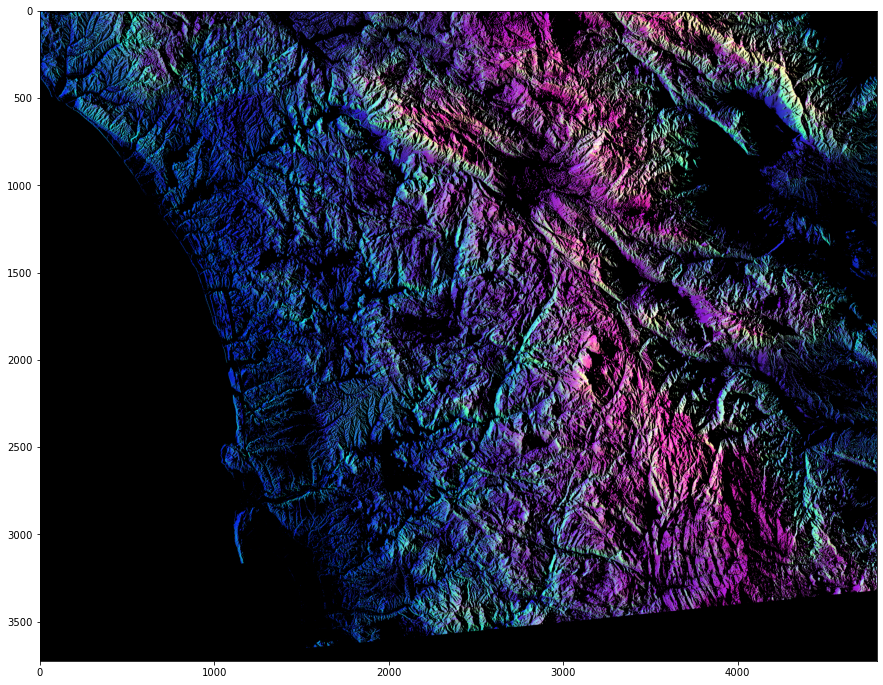

In [21]:
photo_data = imageio.imread("./numpy_satellite/wifire/sd-3layers.jpg")
blue_mask = photo_data[:, :, 2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style = "font-family: Arial; font-size:1.75em; color: #2462C0; font-type: bold"><br> Composite mask that takes thresholds on <br><br>all three layers: RED, GREEN and BLUE.<br><br>

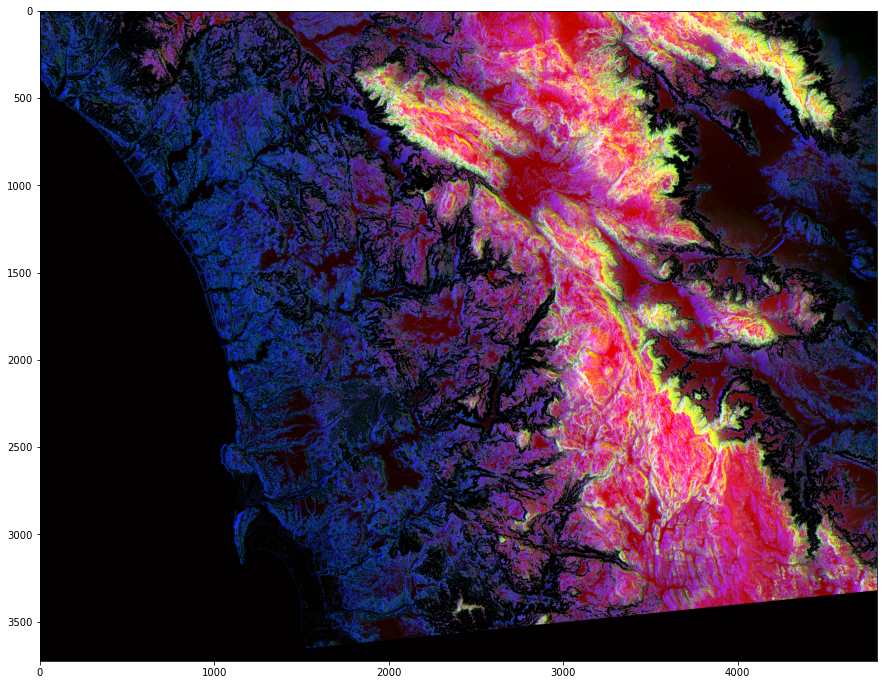

In [7]:
photo_data = imageio.imread("./numpy_satellite/wifire/sd-3layers.jpg")
red_mask = photo_data[:, :, 0] < 150
green_mask = photo_data[:, :, 1] > 100
blue_mask = photo_data[:, :, 2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [41]:
a = np.array([[0,0], [0,0]])
b1 = np.array([1,1])
b2 = 1

print(a)
print("")
print(b1)
print("")
print(a+b1)
print("")
print(a+b2)

[[0 0]
 [0 0]]

[1 1]

[[1 1]
 [1 1]]

[[1 1]
 [1 1]]


In [42]:
a = np.array([[0], [0]])
b1 = np.array([1,1])

print(a)
print("")
print(b1)
print("")
print(a+b1)

[[0]
 [0]]

[1 1]

[[1 1]
 [1 1]]
